# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_kapur_results = pickle.load(open('results/evaluation/PSO/PSO_kapur_RGB_df.pkl', 'rb'))
ga_kapur_results = pickle.load(open('results/evaluation/GA/GA_kapur_RGB_df.pkl', 'rb'))
woa_kapur_results = pickle.load(open('results/evaluation/WOA/WOA_kapur_RGB_df.pkl', 'rb'))
gwo_kapur_results = pickle.load(open('results/evaluation/GWO/GWO_kapur_RGB_df.pkl', 'rb'))
sma_kapur_results = pickle.load(open('results/evaluation/SMA/SMA_kapur_RGB_df.pkl', 'rb'))
mem_gwo_kapur_results = pickle.load(open('results/evaluation/memGWO/memGWO_kapur_RGB_df.pkl', 'rb'))

In [4]:
mem_gwo_kapur_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds R,Mean best_thresholds G,Mean best_thresholds B,Mean Fitness R,Mean Fitness G,Mean Fitness B,...,Regions B,Fitness R,Fitness G,Fitness B,CPU_time (seconds),MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,kapur_entropy,max,"[77, 169]","[79, 176]","[131, 187]",11.516326,12.527005,12.141481,...,"[[131, 255, 255, 255, 255, 255, 255, 255, 255,...","[11.516335925490615, 11.516335925490615, 11.51...","[12.52692490343442, 12.527011119424301, 12.527...","[12.14148096951028, 12.14148096951028, 12.1414...","[7.166840076446533, 6.86362886428833, 11.38708...","[2519.208491007487, 2523.781707763672, 2523.78...","[50.191717354634186, 50.23725418216716, 50.237...","[14.118162494447725, 14.110285725832608, 14.11...","[0.7685608079396896, 0.7683261151563018, 0.768...","[0.9328489107063768, 0.9327005178460971, 0.932..."
1,AirplaneF16.tiff,3,kapur_entropy,max,"[73, 124, 176]","[67, 126, 184]","[70, 134, 187]",14.750411,15.807633,15.343704,...,"[[134, 255, 255, 255, 255, 255, 255, 255, 255,...","[14.750426649535349, 14.750426649535349, 14.75...","[15.806520148696954, 15.807958945983751, 15.80...","[15.343723829257907, 15.343723829257907, 15.34...","[7.222255229949951, 7.830782413482666, 6.80622...","[2078.0015970865884, 2079.443375905355, 2079.4...","[45.58510279780653, 45.60091420032448, 45.6009...","[14.954344838615611, 14.951332620225305, 14.95...","[0.7915110682844962, 0.7910386396385488, 0.791...","[0.9488065960210604, 0.9488382499997597, 0.948..."
2,AirplaneF16.tiff,4,kapur_entropy,max,"[70, 109, 146, 182]","[53, 93, 138, 184]","[70, 111, 146, 190]",17.487681,18.681581,18.109031,...,"[[111, 255, 255, 255, 255, 255, 255, 255, 255,...","[17.49020950463806, 17.489425117350397, 17.490...","[18.681503352966732, 18.681620549079568, 18.68...","[18.10922361200402, 18.10922361200402, 18.1092...","[8.275252103805542, 8.264235734939575, 8.06626...","[1888.0112800598145, 1889.626890818278, 1885.5...","[43.4512517663164, 43.46983886349567, 43.42275...","[15.37075776174346, 15.36704300215906, 15.3764...","[0.7987038400118629, 0.7985017679152913, 0.798...","[0.9566679751151961, 0.9566042831852979, 0.956..."
3,AirplaneF16.tiff,5,kapur_entropy,max,"[65, 94, 124, 155, 184]","[38, 75, 113, 150, 187]","[69, 98, 128, 158, 192]",20.072558,21.383271,20.592174,...,"[[128, 255, 255, 255, 255, 255, 255, 255, 255,...","[20.07347092060286, 20.075210474384782, 20.072...","[21.38515681713851, 21.38605888349969, 21.3793...","[20.597018114173654, 20.593378163456215, 20.59...","[10.387528657913208, 8.427037477493286, 8.0079...","[1771.205815633138, 1770.984681447347, 1768.25...","[42.0856960930093, 42.08306882164545, 42.05065...","[15.648113313546979, 15.648655561948656, 15.65...","[0.7987234764280694, 0.7986935636888052, 0.799...","[0.9608303588605952, 0.9607786040966554, 0.961..."
4,Lena.png,2,kapur_entropy,max,"[134, 192]","[80, 150]","[96, 142]",11.612067,12.698956,12.068813,...,"[[142, 142, 142, 142, 142, 142, 142, 142, 142,...","[11.612067412579773, 11.612067412579773, 11.61...","[12.698959273000352, 12.698959273000352, 12.69...","[12.068814847692082, 12.068814847692082, 12.06...","[8.587990760803223, 9.957761287689209, 8.95540...","[1846.134838104248, 1846.134838104248, 1846.13...","[42.96667124765715, 42.96667124765715, 42.9666...","[15.46816942993814, 15.46816942993814, 15.4681...","[0.6426126551076533, 0.6426126551076533, 0.642...","[0.89487516545066, 0.89487516545066, 0.8948751..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value R
pso_fitness_r = pso_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
gwo_fitness_r = gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
mem_gwo_fitness_r= mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
ga_fitness_r = ga_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
woa_fitness_r = woa_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
sma_fitness_r = sma_kapur_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()

pso_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R PSO','Fitness R': 'Fitness R PSO'}, inplace=True)
gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GWO','Fitness R': 'Fitness R GWO'}, inplace=True)
mem_gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R MemoryGWO','Fitness R': 'Fitness R MemoryGWO'}, inplace=True)
ga_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GA', 'Fitness R': 'Fitness R GA'}, inplace=True)
woa_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R WOA','Fitness R': 'Fitness R WOA'}, inplace=True)
sma_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R SMA', 'Fitness R': 'Fitness R SMA'}, inplace=True)

### ======== Fitness Value G
pso_fitness_g = pso_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
gwo_fitness_g = gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
mem_gwo_fitness_g= mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
ga_fitness_g = ga_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
woa_fitness_g = woa_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
sma_fitness_g = sma_kapur_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()

pso_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G PSO','Fitness G': 'Fitness G PSO'}, inplace=True)
gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GWO','Fitness G': 'Fitness G GWO'}, inplace=True)
mem_gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G MemoryGWO','Fitness G': 'Fitness G MemoryGWO'}, inplace=True)
ga_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GA', 'Fitness G': 'Fitness G GA'}, inplace=True)
woa_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G WOA','Fitness G': 'Fitness G WOA'}, inplace=True)
sma_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G SMA', 'Fitness G': 'Fitness G SMA'}, inplace=True)

### ======== Fitness Value B
pso_fitness_b = pso_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
gwo_fitness_b = gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
mem_gwo_fitness_b= mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
ga_fitness_b = ga_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
woa_fitness_b = woa_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
sma_fitness_b = sma_kapur_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()

pso_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B PSO','Fitness B': 'Fitness B PSO'}, inplace=True)
gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GWO','Fitness B': 'Fitness B GWO'}, inplace=True)
mem_gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B MemoryGWO','Fitness B': 'Fitness B MemoryGWO'}, inplace=True)
ga_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GA', 'Fitness B': 'Fitness B GA'}, inplace=True)
woa_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B WOA','Fitness B': 'Fitness B WOA'}, inplace=True)
sma_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B SMA', 'Fitness B': 'Fitness B SMA'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Threshold R
pso_threshold_r = pso_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
gwo_threshold_r = gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
mem_gwo_threshold_r = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
ga_threshold_r = ga_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
woa_threshold_r = woa_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
sma_threshold_r = sma_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()

pso_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R PSO'}, inplace=True)
gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GWO'}, inplace=True)
mem_gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R MemoryGWO'}, inplace=True)
ga_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GA'}, inplace=True)
woa_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R WOA'}, inplace=True)
sma_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R SMA'}, inplace=True)

### ========== Threshold G
pso_threshold_g = pso_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
gwo_threshold_g = gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
mem_gwo_threshold_g = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
ga_threshold_g = ga_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
woa_threshold_g = woa_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
sma_threshold_g = sma_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()

pso_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G PSO'}, inplace=True)
gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GWO'}, inplace=True)
mem_gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G MemoryGWO'}, inplace=True)
ga_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GA'}, inplace=True)
woa_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G WOA'}, inplace=True)
sma_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G SMA'}, inplace=True)

### ========== Threshold B
pso_threshold_b = pso_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
gwo_threshold_b = gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
mem_gwo_threshold_b = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
ga_threshold_b = ga_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
woa_threshold_b = woa_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
sma_threshold_b = sma_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()

pso_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B PSO'}, inplace=True)
gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GWO'}, inplace=True)
mem_gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B MemoryGWO'}, inplace=True)
ga_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GA'}, inplace=True)
woa_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B WOA'}, inplace=True)
sma_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B SMA'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = pso_psnr.merge(gwo_psnr, on=on).merge(mem_gwo_psnr, on=on).merge(ga_psnr, on=on).merge(sma_psnr, on=on).merge(woa_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = pso_rmse.merge(gwo_rmse, on=on).merge(mem_gwo_rmse, on=on).merge(ga_rmse, on=on).merge(sma_rmse, on=on).merge(woa_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = pso_ssim.merge(gwo_ssim, on=on).merge(mem_gwo_ssim, on=on).merge(ga_ssim, on=on).merge(sma_ssim, on=on).merge(woa_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = pso_uqi.merge(gwo_uqi, on=on).merge(mem_gwo_uqi, on=on).merge(ga_uqi, on=on).merge(sma_uqi, on=on).merge(woa_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = pso_cpu_time.merge(gwo_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on).merge(ga_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(woa_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Fitness Value R
fitness_r_merge = pso_fitness_r.merge(gwo_fitness_r, on=on).merge(mem_gwo_fitness_r, on=on).merge(ga_fitness_r, on=on).merge(sma_fitness_r, on=on).merge(woa_fitness_r, on=on)
fitness_r_merge = fitness_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value G
fitness_g_merge = pso_fitness_g.merge(gwo_fitness_g, on=on).merge(mem_gwo_fitness_g, on=on).merge(ga_fitness_g, on=on).merge(sma_fitness_g, on=on).merge(woa_fitness_g, on=on)
fitness_g_merge = fitness_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value B
fitness_b_merge = pso_fitness_b.merge(gwo_fitness_b, on=on).merge(mem_gwo_fitness_b, on=on).merge(ga_fitness_b, on=on).merge(sma_fitness_b, on=on).merge(woa_fitness_b, on=on)
fitness_b_merge = fitness_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Threshold R
threshold_r_merge = pso_threshold_r.merge(gwo_threshold_r, on=on).merge(mem_gwo_threshold_r, on=on).merge(ga_threshold_r, on=on).merge(sma_threshold_r, on=on).merge(woa_threshold_r, on=on)
threshold_r_merge = threshold_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold G
threshold_g_merge = pso_threshold_g.merge(gwo_threshold_g, on=on).merge(mem_gwo_threshold_g, on=on).merge(ga_threshold_g, on=on).merge(sma_threshold_g, on=on).merge(woa_threshold_g, on=on)
threshold_g_merge = threshold_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold B
threshold_b_merge = pso_threshold_b.merge(gwo_threshold_b, on=on).merge(mem_gwo_threshold_b, on=on).merge(ga_threshold_b, on=on).merge(sma_threshold_b, on=on).merge(woa_threshold_b, on=on)
threshold_b_merge = threshold_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def findMinimumMetrics(list_of_values):
    return min(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMinimumMetrics)
    fitness_r_merge[f'Best Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(findMaximumMetrics)
    fitness_g_merge[f'Best Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(findMaximumMetrics)    
    fitness_b_merge[f'Best Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_r_merge[f'Std Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(calculateStandardDeviation)
    fitness_g_merge[f'Std Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(calculateStandardDeviation)    
    fitness_b_merge[f'Std Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(calculateStandardDeviation)    

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR PSO   
image_name                                            
AirplaneF16.tiff      0            2      14.112123  \
                      1            3      14.973844   
                      2            4      15.404986   
                      3            5      15.789133   
Lena.png              4            2      15.459829   
                      5            3      17.975954   
                      6            4      19.789147   
                      7            5      21.766027   
Male.tiff             8            2      13.200569   
                      9            3      16.243281   
                      10           4      18.234775   
                      11           5      19.214194   
Mandrill.tiff         12           2      13.792103   
                      13           3      16.184810   
                      14           4      17.339404   
                      15           5      18.629100   
Peppers.tiff          16           2      13.149298   
                      17           3      15.095543   
                      18           4      16.841022   
                      19           5      17.872740   
Sailboat on lake.tiff 20           2      13.065558   
                      21           3      15.931409   
                      22           4      17.075785   
                      23           5      17.931705   

                                                                   PSNR PSO   
image_name                                                                    
AirplaneF16.tiff      0   [14.110285725832608, 14.110937734195993, 14.11...  \
                      1   [14.965050676306085, 14.965155898224756, 14.99...   
                      2   [15.41329328082819, 15.417512426929257, 15.424...   
                      3   [15.697089123145885, 15.911263174125414, 15.72...   
Lena.png              4   [15.472380655420913, 15.472380655420913, 15.46...   
                      5   [17.96630723544744, 18.040578640467444, 17.985...   
                      6   [19.648460719187383, 20.074486144601682, 20.03...   
                      7   [21.80233368954515, 21.94466062618766, 21.3123...   
Male.tiff             8   [13.200568962809466, 13.200568962809466, 13.20...   
                      9   [16.24746088485996, 16.260713950012327, 16.258...   
                      10  [17.694845717717417, 18.307974012115793, 17.59...   
                      11  [19.247181445189096, 18.969828810288476, 19.24...   
Mandrill.tiff         12  [13.791990817111092, 13.791990817111092, 13.79...   
                      13  [16.235544454206227, 15.933457591913665, 16.31...   
                      14  [17.192075652267313, 17.723621656475334, 17.59...   
                      15  [18.546349403981136, 18.705158863559536, 18.54...   
Peppers.tiff          16  [13.105098736946832, 13.105098736946832, 13.10...   
                      17  [15.103069094795167, 15.15393780300891, 15.124...   
                      18  [17.01046830324399, 16.90051375121463, 16.4367...   
                      19  [17.832926158351583, 17.893856765869668, 18.17...   
Sailboat on lake.tiff 20  [13.067171733990293, 13.067171733990293, 13.06...   
                      21  [15.905106768244385, 15.945228593329654, 15.92...   
                      22  [17.04844530963175, 17.118587044397806, 17.091...   
                      23  [17.772445607488226, 17.75408003484121, 17.833...   

                          Mean PSNR GWO   
image_name                                
AirplaneF16.tiff      0       14.063565  \
                      1       14.951424   
                      2       15.372379   
                      3       15.645625   
Lena.png              4       15.468169   
                      5       17.957770   
                      6       19.608494   
                      7       21.843404   
Male.tiff             8       13.200993   
                      9       16.260724   
                      10

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_kapur_RGB.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_kapur_RGB.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_kapur_RGB.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_kapur_RGB.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE PSO   
image_name                                            
AirplaneF16.tiff      0            2      50.226645  \
                      1            3      45.483223   
                      2            4      43.281922   
                      3            5      41.413977   
Lena.png              4            2      43.007973   
                      5            3      32.192540   
                      6            4      26.134138   
                      7            5      20.811687   
Male.tiff             8            2      55.784267   
                      9            3      39.298790   
                      10           4      31.257235   
                      11           5      27.925772   
Mandrill.tiff         12           2      52.111673   
                      13           3      39.568185   
                      14           4      34.659059   
                      15           5      29.868977   
Peppers.tiff          16           2      56.125130   
                      17           3      44.852379   
                      18           4      36.692246   
                      19           5      32.583904   
Sailboat on lake.tiff 20           2      56.658164   
                      21           3      40.735306   
                      22           4      35.707526   
                      23           5      32.370106   

                                                                   RMSE PSO   
image_name                                                                    
AirplaneF16.tiff      0   [50.23725418216716, 50.23348325231533, 50.1882...  \
                      1   [45.52895125828667, 45.528399718399676, 45.394...   
                      2   [43.23898755885888, 43.217989444361656, 43.183...   
                      3   [41.84906162074347, 40.829778295932336, 41.691...   
Lena.png              4   [42.94584453998741, 42.94584453998741, 42.9666...   
                      5   [32.227366546156475, 31.952971232820722, 32.15...   
                      6   [26.55321698907062, 25.282258832911587, 25.385...   
                      7   [20.72161001619834, 20.384832587928166, 21.924...   
Male.tiff             8   [55.78426718365663, 55.78426718365663, 55.7842...   
                      9   [39.279607203851036, 39.219719470277326, 39.22...   
                      10  [33.25047811962736, 30.984285078432812, 33.644...   
                      11  [27.808726971333922, 28.711027815280993, 27.82...   
Mandrill.tiff         12  [52.1123477817971, 52.1123477817971, 52.112347...   
                      13  [39.33353304946973, 40.725582132224275, 38.982...   
                      14  [35.231927030774784, 33.140503140491816, 33.63...   
                      15  [30.14551517834516, 29.599354305613574, 30.166...   
Peppers.tiff          16  [56.40079733012176, 56.40079733012176, 56.4007...   
                      17  [44.81121564697849, 44.5495467939633, 44.70036...   
                      18  [35.976322299460534, 36.43464084965269, 38.432...   
                      19  [32.72607132042307, 32.49730467745967, 31.4799...   
Sailboat on lake.tiff 20  [56.6476103024704, 56.6476103024704, 56.647610...   
                      21  [40.85872798332026, 40.67042874825209, 40.7609...   
                      22  [35.81936767840745, 35.5312779677255, 35.64407...   
                      23  [32.95474079548531, 33.024494501673516, 32.723...   

                          Mean RMSE GWO   
image_name                                
AirplaneF16.tiff      0       50.519327  \
                      1       45.600437   
                      2       43.443156   
                      3       42.097854   
Lena.png              4       42.966671   
                      5       32.259066   
                      6       26.677187   
                      7       20.633396   
Male.tiff             8       55.781550   
                      9       39.219740   
                      10

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_kapur_RGB.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_kapur_RGB.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_kapur_RGB.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_kapur_RGB.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM PSO   
image_name                                            
AirplaneF16.tiff      0            2       0.768083  \
                      1            3       0.789319   
                      2            4       0.795464   
                      3            5       0.791646   
Lena.png              4            2       0.642806   
                      5            3       0.699236   
                      6            4       0.731891   
                      7            5       0.779447   
Male.tiff             8            2       0.457969   
                      9            3       0.543708   
                      10           4       0.622599   
                      11           5       0.651911   
Mandrill.tiff         12           2       0.661945   
                      13           3       0.747221   
                      14           4       0.787719   
                      15           5       0.828752   
Peppers.tiff          16           2       0.536888   
                      17           3       0.603534   
                      18           4       0.647073   
                      19           5       0.675228   
Sailboat on lake.tiff 20           2       0.608643   
                      21           3       0.697581   
                      22           4       0.745155   
                      23           5       0.781012   

                                                                   SSIM PSO   
image_name                                                                    
AirplaneF16.tiff      0   [0.7683261151563018, 0.7685176094857828, 0.768...  \
                      1   [0.7874606752192702, 0.7902926965942886, 0.788...   
                      2   [0.7913287882099591, 0.7916767120423076, 0.793...   
                      3   [0.7950166399723749, 0.7844299523917487, 0.798...   
Lena.png              4   [0.6430450042645107, 0.6430450042645107, 0.642...   
                      5   [0.6995160935500312, 0.6979979901410903, 0.699...   
                      6   [0.7278317887476584, 0.7382525402285567, 0.747...   
                      7   [0.7809951146945836, 0.7828936692276169, 0.776...   
Male.tiff             8   [0.45796949578080487, 0.45796949578080487, 0.4...   
                      9   [0.5437759514252337, 0.5434989748505802, 0.543...   
                      10  [0.602402282704292, 0.6254817072852217, 0.5976...   
                      11  [0.6524617752660098, 0.6376931627365703, 0.652...   
Mandrill.tiff         12  [0.6619547555776549, 0.6619547555776549, 0.661...   
                      13  [0.7487000853899538, 0.7386995814811396, 0.751...   
                      14  [0.786683138768713, 0.7962612279705802, 0.7942...   
                      15  [0.8286472035891452, 0.8293744650511857, 0.828...   
Peppers.tiff          16  [0.5353537277400466, 0.5353537277400466, 0.535...   
                      17  [0.603945894993252, 0.6037783306831616, 0.6038...   
                      18  [0.6485301078224388, 0.6463401510257486, 0.649...   
                      19  [0.6692746175454024, 0.6798710775438025, 0.678...   
Sailboat on lake.tiff 20  [0.608578968671297, 0.608578968671297, 0.60857...   
                      21  [0.6947651222329868, 0.6983314774626752, 0.695...   
                      22  [0.7475283170950208, 0.7466529220044293, 0.742...   
                      23  [0.7858771232777088, 0.7770911981552387, 0.783...   

                          Mean SSIM GWO   
image_name                                
AirplaneF16.tiff      0        0.766157  \
                      1        0.791083   
                      2        0.798662   
                      3        0.798754   
Lena.png              4        0.642613   
                      5        0.700096   
                      6        0.732240   
                      7        0.782785   
Male.tiff             8        0.457966   
                      9        0.543800   
                      10

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_kapur_RGB.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_kapur_RGB.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_kapur_RGB.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_kapur_RGB.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_kapur_RGB.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_kapur_RGB.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_kapur_RGB.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_kapur_RGB.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_kapur_RGB.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_kapur_RGB.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_kapur_RGB.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_kapur_RGB.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_r_merge[[f'{metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_R.xlsx')
fitness_r_merge[[f'Mean {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_R.xlsx')
fitness_r_merge[[f'Best {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_kapur_R.xlsx')
fitness_r_merge[[f'Std {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_kapur_R.xlsx')

fitness_g_merge[[f'{metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_G.xlsx')
fitness_g_merge[[f'Mean {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_G.xlsx')
fitness_g_merge[[f'Best {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_kapur_G.xlsx')
fitness_g_merge[[f'Std {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_kapur_G.xlsx')

fitness_b_merge[[f'{metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_B.xlsx')
fitness_b_merge[[f'Mean {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur_B.xlsx')
fitness_b_merge[[f'Best {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_kapur_B.xlsx')
fitness_b_merge[[f'Std {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_kapur_B.xlsx')

## Mean Thresholds

In [18]:
threshold_r_merge

thresholds           Thresholds R PSO   
image_name                                                        
AirplaneF16.tiff      0            2                  [77, 169]  \
                      1            3             [73, 125, 178]   
                      2            4        [71, 111, 147, 183]   
                      3            5    [67, 98, 129, 159, 187]   
Lena.png              4            2                 [134, 191]   
                      5            3            [114, 159, 202]   
                      6            4       [109, 143, 176, 209]   
                      7            5  [105, 136, 165, 196, 224]   
Male.tiff             8            2                  [91, 172]   
                      9            3             [60, 115, 174]   
                      10           4         [45, 89, 131, 174]   
                      11           5    [40, 79, 118, 158, 207]   
Mandrill.tiff         12           2                  [99, 174]   
                      13           3             [65, 127, 189]   
                      14           4         [34, 88, 142, 196]   
                      15           5    [31, 72, 115, 158, 202]   
Peppers.tiff          16           2                  [91, 156]   
                      17           3             [59, 103, 162]   
                      18           4         [57, 97, 138, 178]   
                      19           5    [42, 74, 105, 142, 180]   
Sailboat on lake.tiff 20           2                  [41, 137]   
                      21           3             [41, 115, 173]   
                      22           4         [41, 94, 137, 181]   
                      23           5    [41, 83, 117, 152, 187]   

                                   Thresholds R GWO   
image_name                                            
AirplaneF16.tiff      0                   [77, 169]  \
                      1              [73, 124, 176]   
                      2         [70, 109, 146, 182]   
                      3     [64, 93, 123, 154, 184]   
Lena.png              4                  [134, 192]   
                      5             [114, 159, 201]   
                      6        [108, 140, 171, 205]   
                      7   [103, 133, 164, 195, 224]   
Male.tiff             8                   [91, 172]   
                      9              [61, 116, 174]   
                      10         [47, 90, 132, 175]   
                      11    [40, 83, 125, 167, 218]   
Mandrill.tiff         12                  [99, 174]   
                      13             [69, 131, 191]   
                      14         [36, 89, 143, 196]   
                      15    [31, 73, 117, 160, 203]   
Peppers.tiff          16                  [91, 156]   
                      17             [60, 103, 162]   
                      18         [57, 97, 138, 178]   
                      19    [46, 78, 108, 145, 181]   
Sailboat on lake.tiff 20                  [73, 153]   
                      21             [41, 115, 173]   
                      22         [41, 93, 136, 180]   
                      23    [41, 82, 115, 150, 185]   

                             Thresholds R MemoryGWO           Thresholds R GA   
image_name                                                                      
AirplaneF16.tiff      0                   [77, 169]                 [88, 168]  \
                      1              [73, 124, 176]            [73, 124, 175]   
                      2         [70, 109, 146, 182]       [67, 106, 145, 181]   
                      3     [65, 94, 124, 155, 184]   [57, 86, 124, 152, 183]   
Lena.png              4                  [134, 192]                [136, 187]   
                      5             [114, 159, 201]           [111, 157, 203]   
                      6        [108, 140, 171, 205]      [105, 144, 180, 214]   
                      7   [106, 137, 167, 198, 226]  [93, 126, 154, 188, 221]   
Male.tiff             8                   

In [19]:
threshold_r_merge.to_excel('results/evaluation/Merge/mean_thresholds_kapur_R_channel.xlsx')
threshold_g_merge.to_excel('results/evaluation/Merge/mean_thresholds_kapur_G_channel.xlsx')
threshold_b_merge.to_excel('results/evaluation/Merge/mean_thresholds_kapur_B_channel.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
rgb_misc_dataset = test_dataset_misc['rgb']
gray_misc_dataset = test_dataset_misc['gray']
rgb_misc_dataset

{'AirplaneF16.tiff': array([[[181,   0,  98],
         [185, 206, 202],
         [165, 207, 197],
         ...,
         [150, 166, 206],
         [150, 164, 202],
         [131, 147, 196]],
 
        [[141,   0, 108],
         [199, 193, 204],
         [195, 189, 200],
         ...,
         [162, 182, 204],
         [141, 155, 195],
         [119, 139, 197]],
 
        [[141,   0, 108],
         [197, 196, 203],
         [193, 193, 199],
         ...,
         [174, 195, 209],
         [144, 159, 196],
         [116, 144, 193]],
 
        ...,
 
        [[160,   0, 172],
         [210, 215, 212],
         [211, 214, 214],
         ...,
         [181, 185, 191],
         [173, 175, 190],
         [158, 144, 168]],
 
        [[163,   0, 173],
         [210, 216, 213],
         [210, 215, 215],
         ...,
         [168, 163, 177],
         [184, 182, 190],
         [167, 164, 184]],
 
        [[ 35, 127,  32],
         [ 33, 123,  34],
         [ 34, 125,  38],
         ...,
        

## 2-Level

In [21]:
mLevel = 2
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[77, 169]","[77, 169]","[77, 169]","[88, 168]","[96, 161]","[77, 169]"
Lena.png,4,2,"[134, 191]","[134, 192]","[134, 192]","[136, 187]","[122, 183]","[134, 191]"
Male.tiff,8,2,"[91, 172]","[91, 172]","[91, 172]","[84, 165]","[3, 7]","[90, 172]"
Mandrill.tiff,12,2,"[99, 174]","[99, 174]","[99, 174]","[103, 174]","[2, 6]","[99, 174]"
Peppers.tiff,16,2,"[91, 156]","[91, 156]","[91, 156]","[87, 151]","[0, 0]","[90, 156]"
Sailboat on lake.tiff,20,2,"[41, 137]","[73, 153]","[90, 161]","[81, 162]","[28, 55]","[43, 138]"


In [22]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[131, 187]","[127, 184]","[131, 187]","[113, 172]","[107, 163]","[124, 183]"
Lena.png,4,2,"[96, 142]","[96, 142]","[96, 142]","[106, 152]","[12, 14]","[96, 142]"
Male.tiff,8,2,"[91, 172]","[91, 172]","[91, 172]","[92, 167]","[0, 0]","[90, 172]"
Mandrill.tiff,12,2,"[93, 167]","[93, 167]","[93, 167]","[92, 166]","[0, 1]","[93, 166]"
Peppers.tiff,16,2,"[103, 163]","[106, 165]","[106, 165]","[94, 152]","[2, 4]","[106, 165]"
Sailboat on lake.tiff,20,2,"[85, 170]","[85, 170]","[85, 170]","[82, 159]","[0, 0]","[85, 170]"


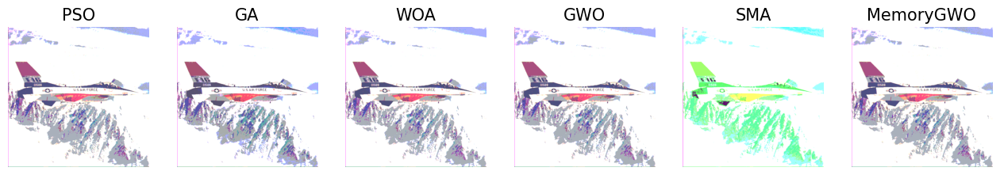

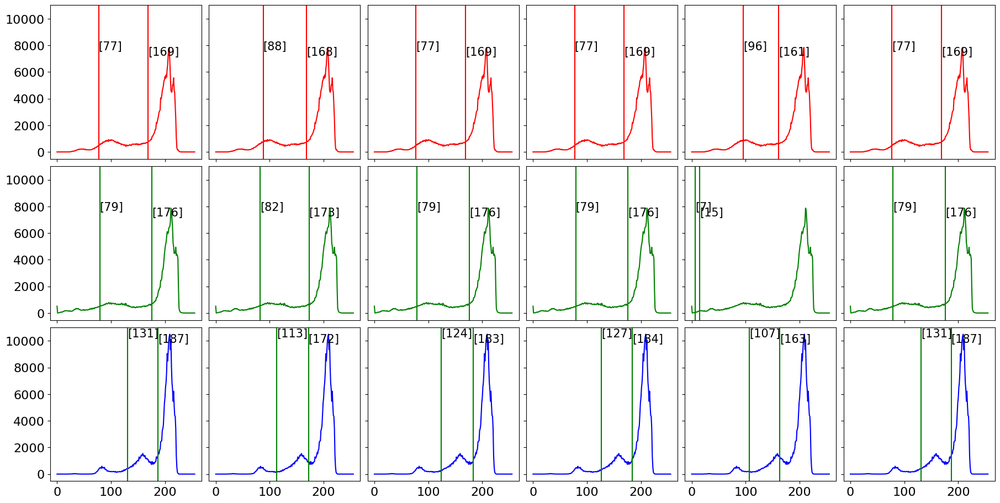

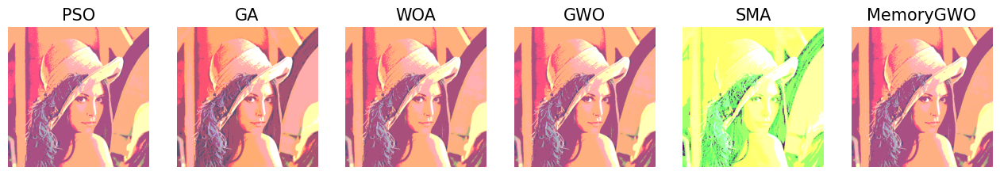

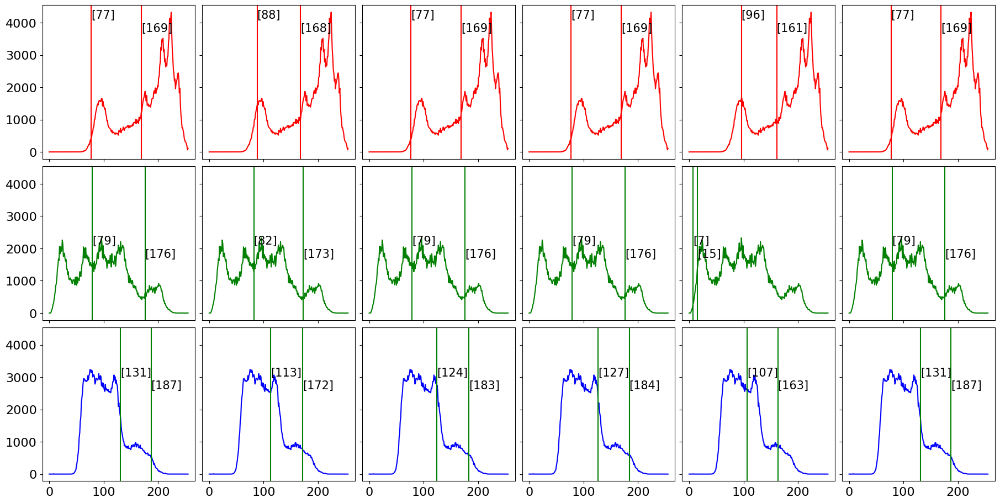

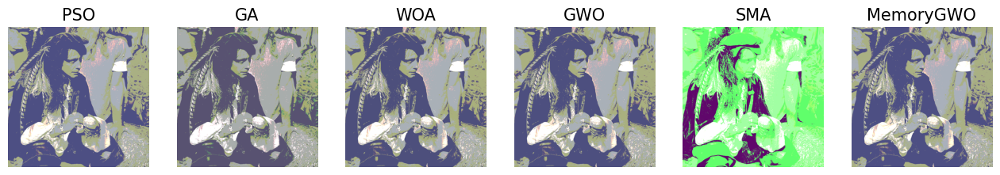

...

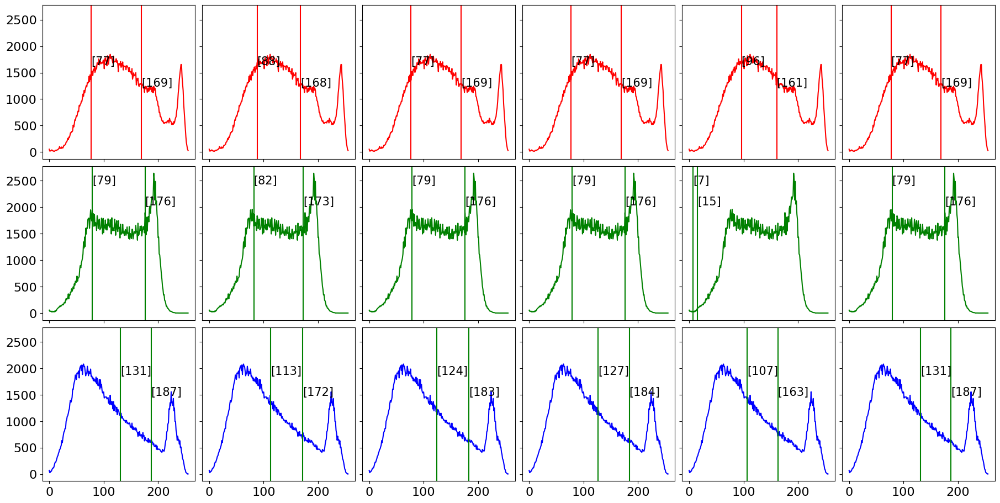

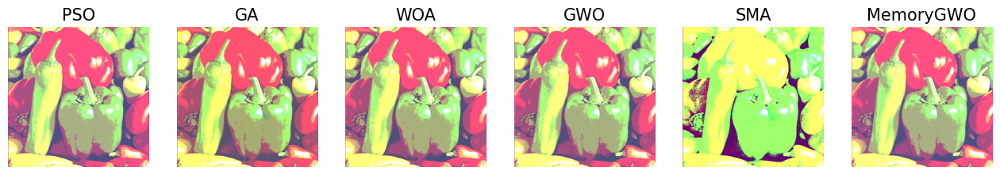

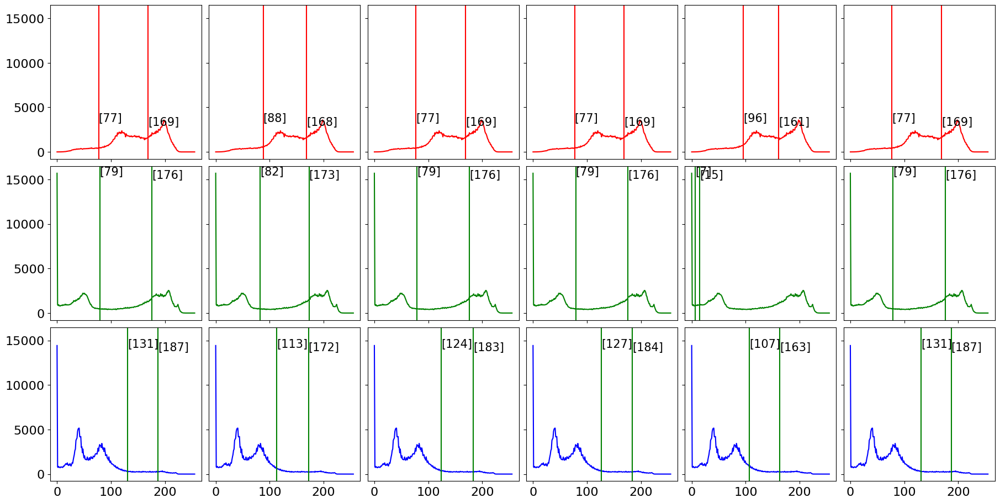

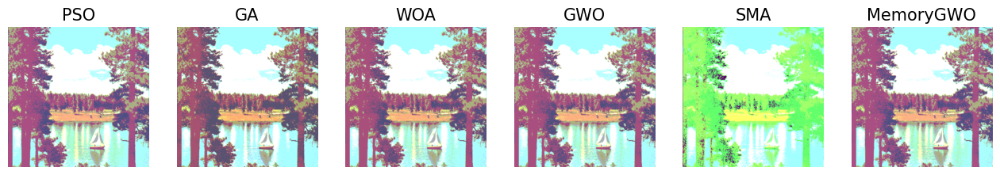

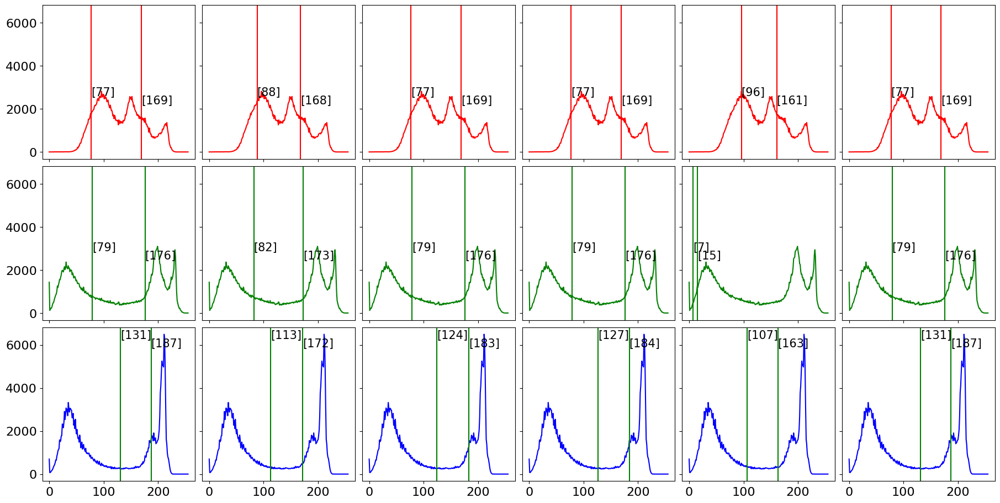

In [23]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 3-Level

In [24]:
mLevel = 3
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[73, 125, 178]","[73, 124, 176]","[73, 124, 176]","[73, 124, 175]","[77, 124, 176]","[72, 124, 176]"
Lena.png,5,3,"[114, 159, 202]","[114, 159, 201]","[114, 159, 201]","[111, 157, 203]","[116, 156, 202]","[113, 158, 201]"
Male.tiff,9,3,"[60, 115, 174]","[61, 116, 174]","[61, 116, 174]","[71, 125, 184]","[45, 96, 161]","[59, 115, 174]"
Mandrill.tiff,13,3,"[65, 127, 189]","[69, 131, 191]","[69, 131, 191]","[57, 120, 184]","[54, 110, 167]","[66, 128, 190]"
Peppers.tiff,17,3,"[59, 103, 162]","[60, 103, 162]","[60, 103, 162]","[74, 123, 169]","[62, 115, 174]","[57, 102, 161]"
Sailboat on lake.tiff,21,3,"[41, 115, 173]","[41, 115, 173]","[41, 115, 173]","[49, 111, 169]","[62, 122, 175]","[41, 114, 172]"


In [25]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[69, 133, 188]","[70, 134, 187]","[70, 134, 187]","[75, 130, 178]","[82, 145, 183]","[70, 133, 187]"
Lena.png,5,3,"[93, 133, 171]","[93, 133, 171]","[93, 133, 171]","[94, 130, 174]","[48, 82, 107]","[92, 132, 170]"
Male.tiff,9,3,"[61, 116, 174]","[61, 116, 174]","[61, 116, 174]","[62, 120, 183]","[51, 117, 174]","[59, 114, 174]"
Mandrill.tiff,13,3,"[70, 128, 185]","[71, 129, 186]","[71, 129, 186]","[69, 125, 187]","[64, 113, 167]","[70, 128, 185]"
Peppers.tiff,17,3,"[61, 114, 169]","[61, 114, 169]","[61, 114, 169]","[69, 118, 167]","[50, 103, 145]","[60, 114, 168]"
Sailboat on lake.tiff,21,3,"[65, 115, 172]","[66, 116, 172]","[66, 116, 173]","[65, 114, 168]","[53, 116, 172]","[65, 115, 172]"


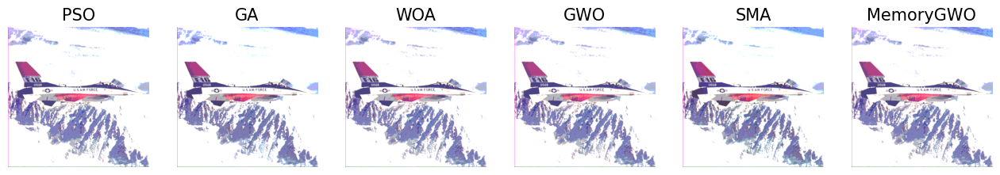

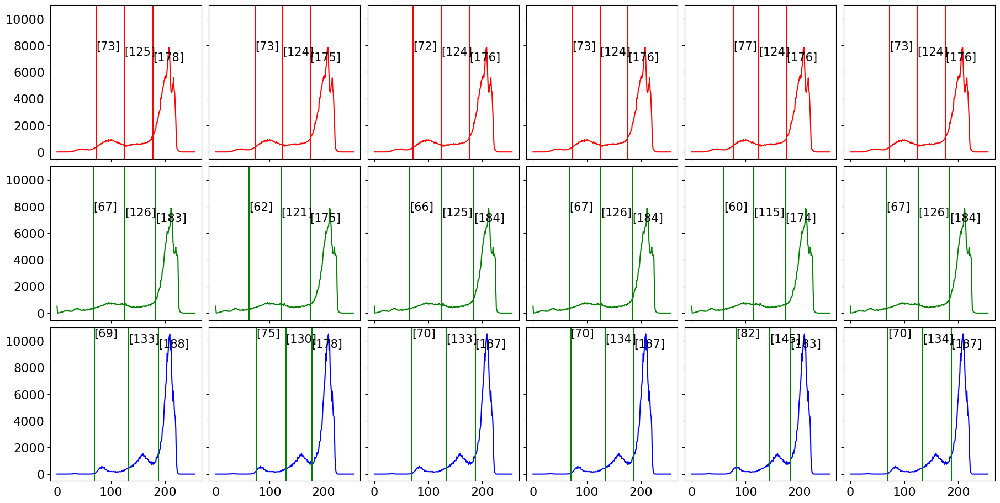

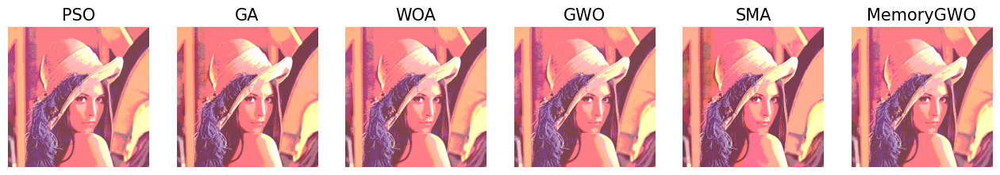

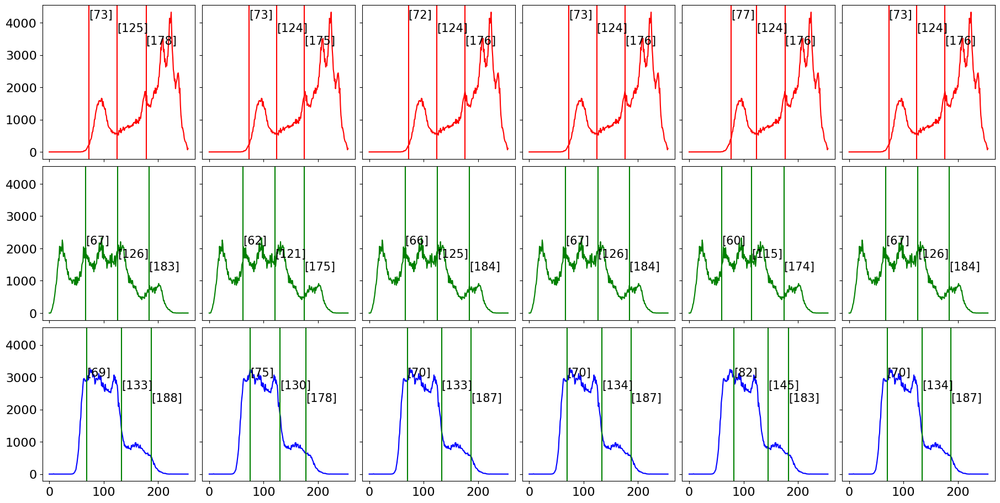

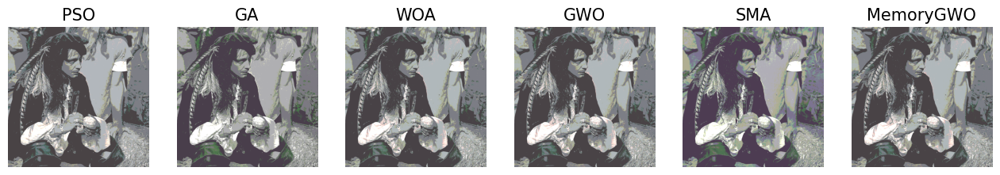

...

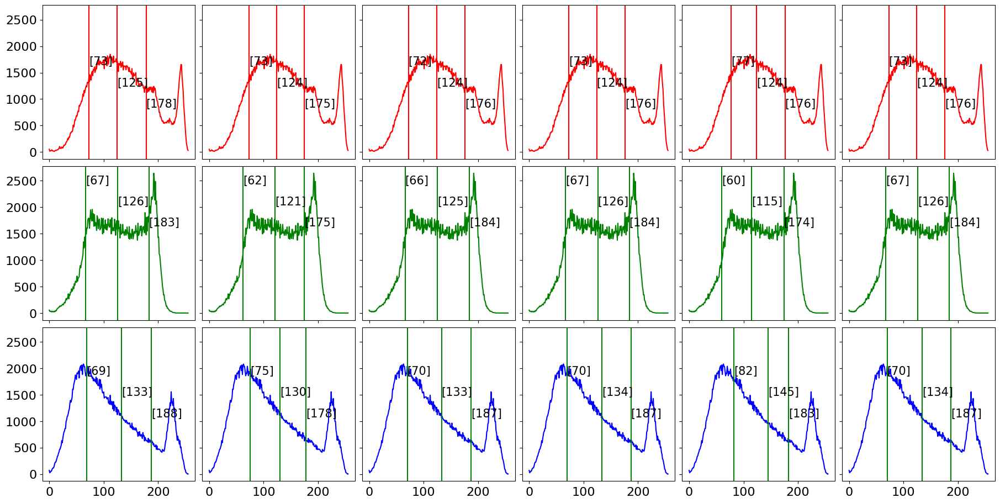

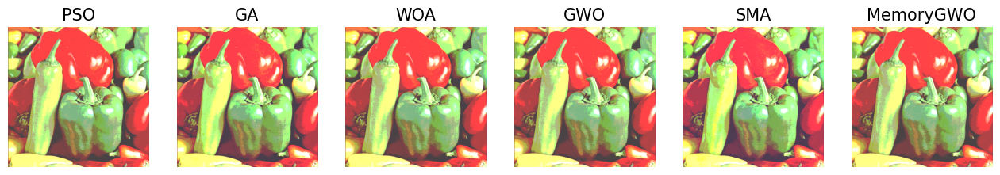

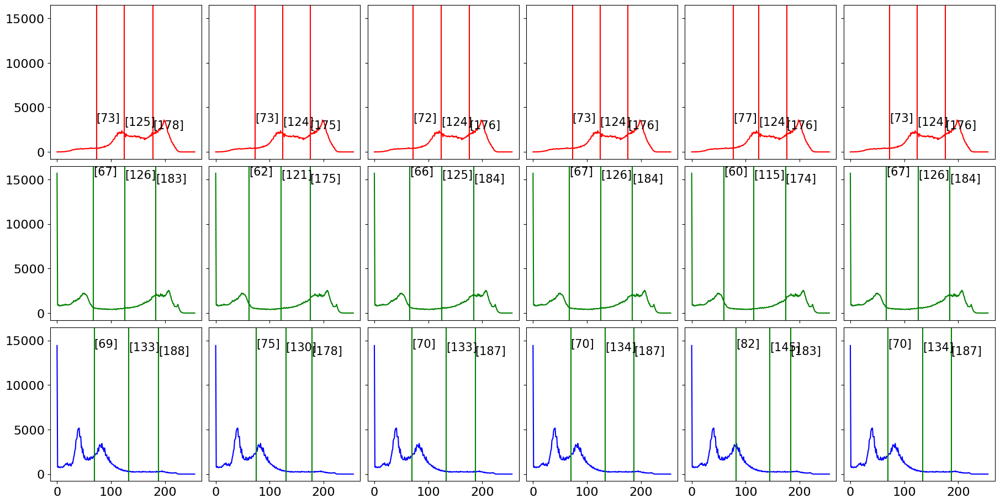

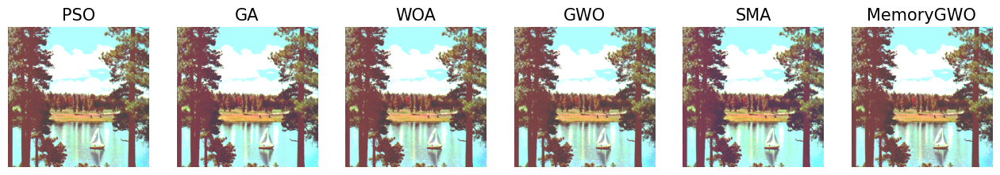

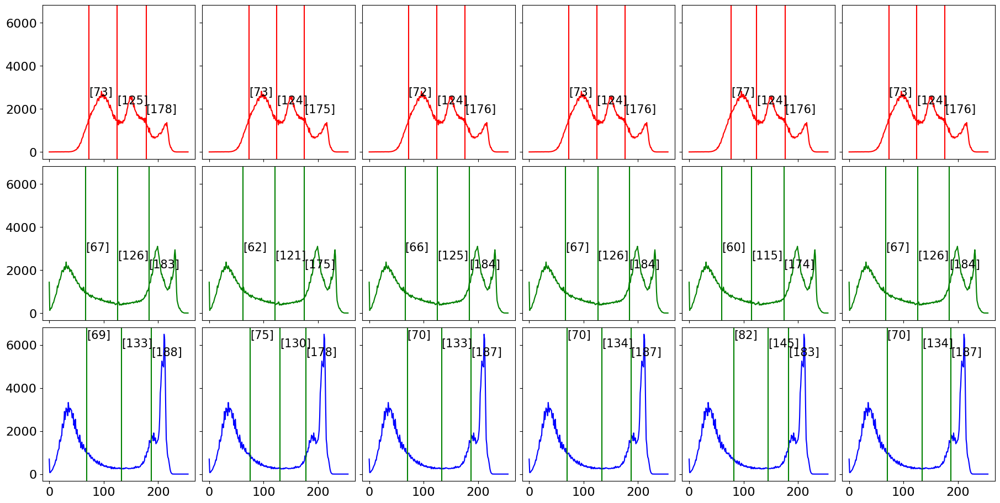

In [26]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 4-Level

In [27]:
mLevel = 4
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[71, 111, 147, 183]","[70, 109, 146, 182]","[70, 109, 146, 182]","[67, 106, 145, 181]","[61, 99, 149, 190]","[69, 107, 144, 182]"
Lena.png,6,4,"[109, 143, 176, 209]","[108, 140, 171, 205]","[108, 140, 171, 205]","[105, 144, 180, 214]","[96, 142, 183, 219]","[107, 139, 171, 205]"
Male.tiff,10,4,"[45, 89, 131, 174]","[47, 90, 132, 175]","[47, 90, 133, 175]","[48, 103, 147, 197]","[56, 111, 167, 213]","[45, 90, 135, 180]"
Mandrill.tiff,14,4,"[34, 88, 142, 196]","[36, 89, 143, 196]","[37, 90, 144, 197]","[47, 95, 147, 199]","[62, 114, 155, 207]","[34, 88, 142, 196]"
Peppers.tiff,18,4,"[57, 97, 138, 178]","[57, 97, 138, 178]","[57, 97, 138, 178]","[51, 99, 141, 180]","[50, 97, 139, 188]","[55, 97, 138, 177]"
Sailboat on lake.tiff,22,4,"[41, 94, 137, 181]","[41, 93, 136, 180]","[41, 92, 136, 180]","[40, 86, 130, 182]","[52, 104, 136, 186]","[41, 91, 135, 180]"


In [28]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[69, 114, 149, 190]","[70, 110, 146, 190]","[70, 111, 146, 190]","[67, 112, 143, 181]","[65, 114, 148, 190]","[69, 108, 143, 189]"
Lena.png,6,4,"[91, 128, 161, 192]","[87, 122, 153, 186]","[88, 125, 156, 188]","[83, 118, 151, 185]","[60, 99, 143, 173]","[82, 114, 145, 180]"
Male.tiff,10,4,"[46, 90, 133, 178]","[47, 90, 132, 175]","[47, 90, 133, 175]","[50, 98, 148, 194]","[53, 111, 161, 206]","[43, 88, 133, 178]"
Mandrill.tiff,14,4,"[49, 98, 147, 196]","[51, 100, 149, 198]","[50, 100, 149, 198]","[47, 97, 146, 199]","[57, 108, 165, 215]","[49, 98, 147, 196]"
Peppers.tiff,18,4,"[54, 99, 135, 178]","[55, 101, 137, 180]","[55, 101, 137, 180]","[57, 101, 142, 184]","[55, 102, 142, 186]","[54, 99, 136, 178]"
Sailboat on lake.tiff,22,4,"[51, 90, 132, 175]","[54, 93, 134, 176]","[54, 93, 134, 176]","[48, 89, 130, 176]","[43, 97, 146, 184]","[52, 91, 132, 176]"


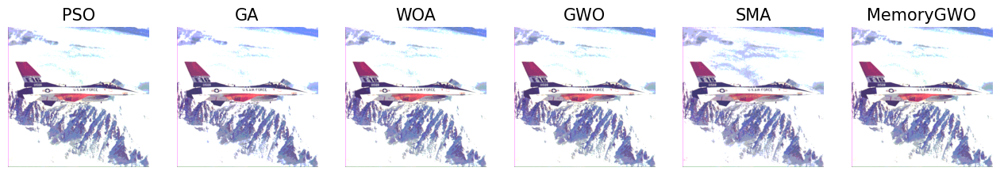

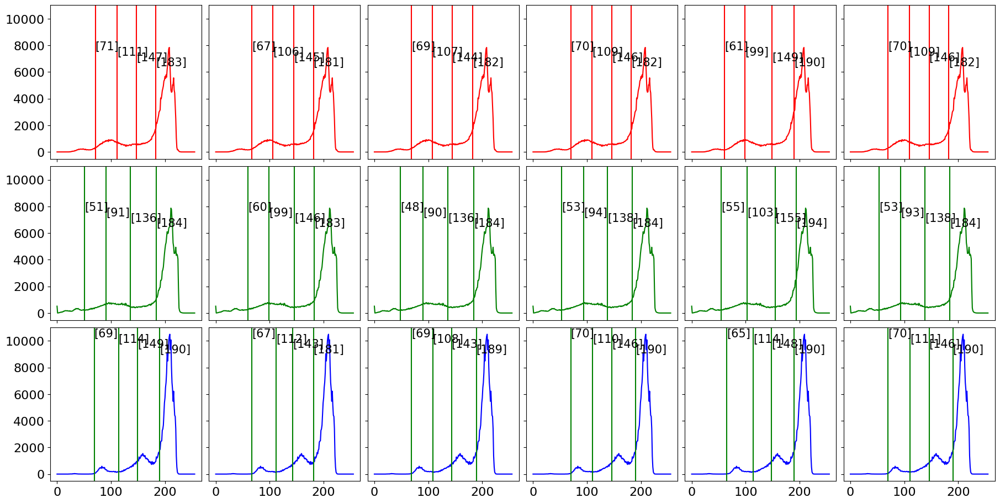

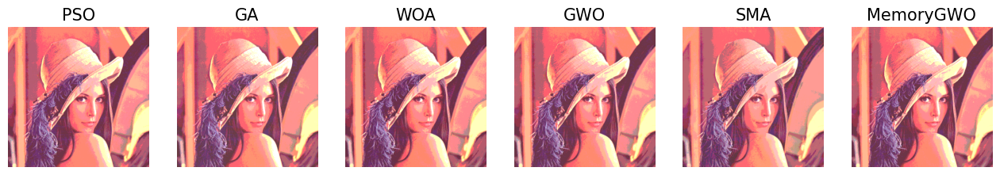

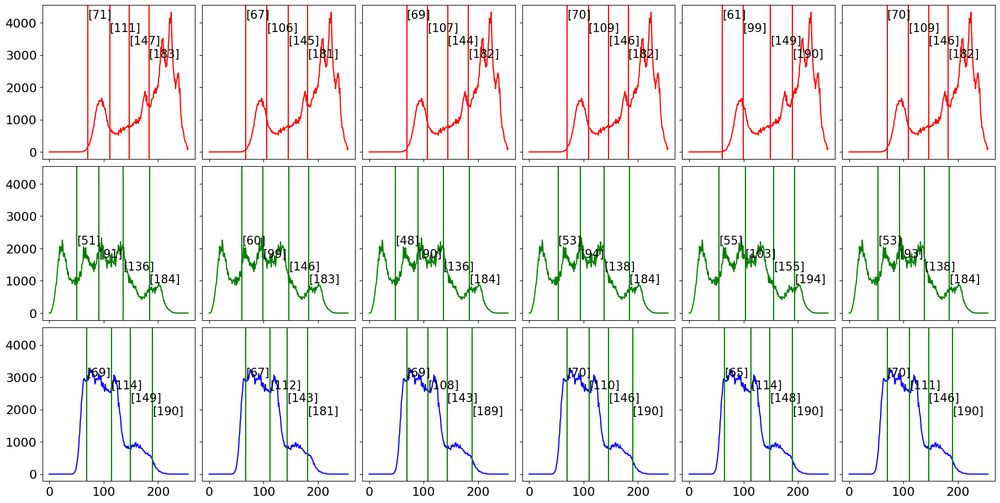

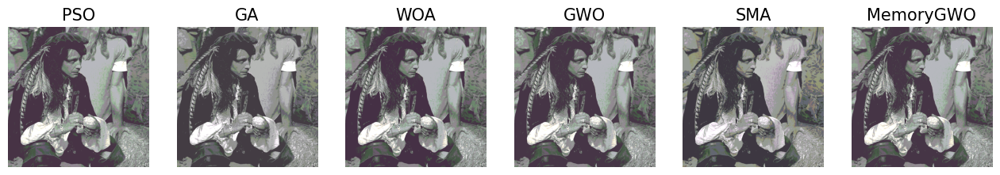

...

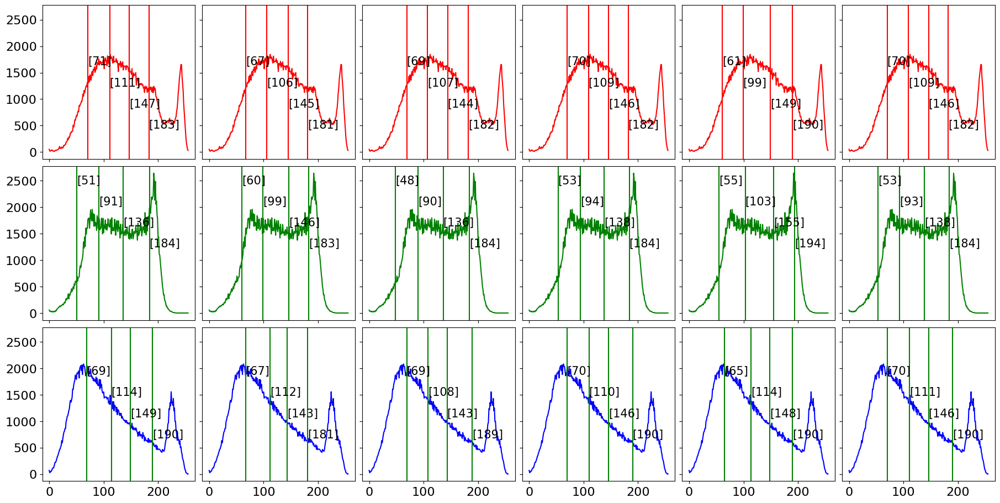

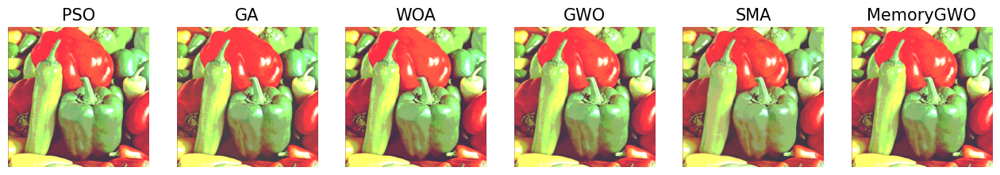

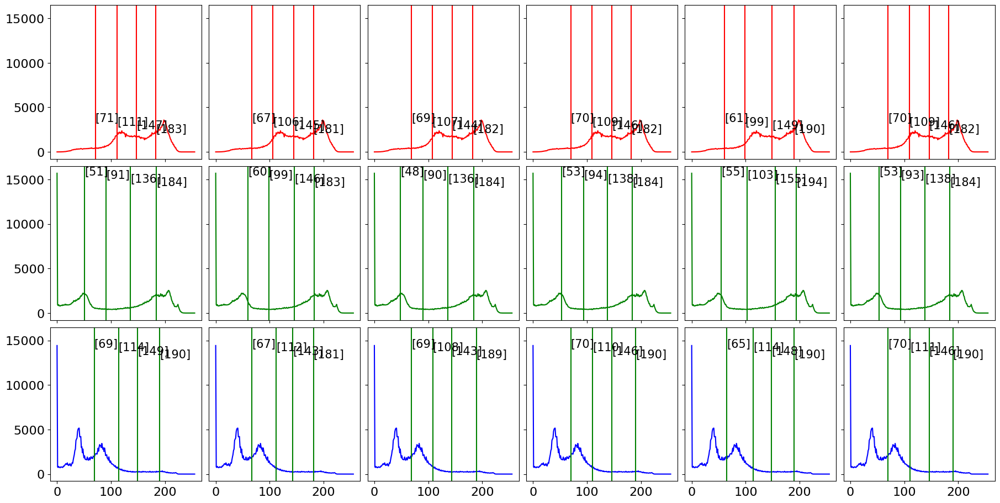

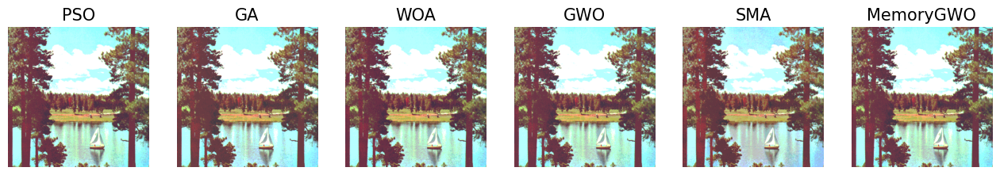

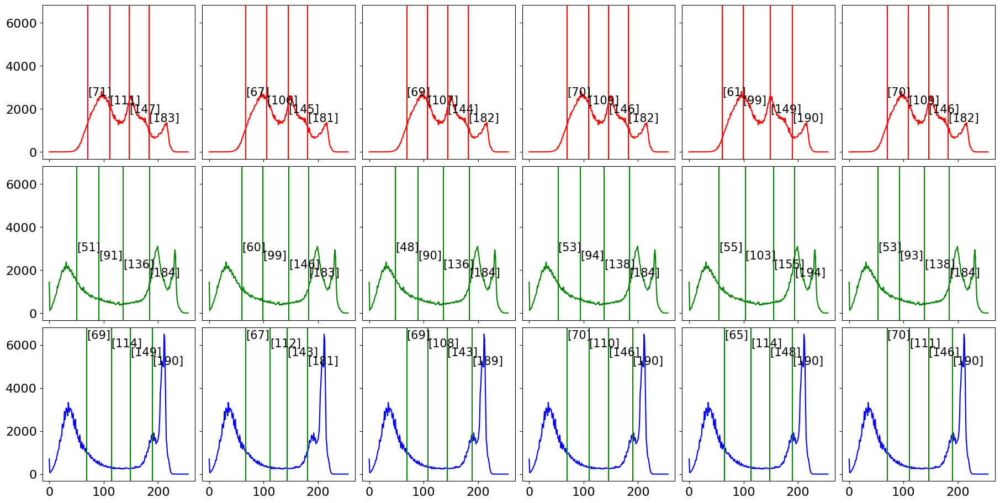

In [29]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 5-Level

In [30]:
mLevel = 5
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[67, 98, 129, 159, 187]","[64, 93, 123, 154, 184]","[65, 94, 124, 155, 184]","[57, 86, 124, 152, 183]","[55, 98, 133, 166, 198]","[57, 84, 117, 150, 183]"
Lena.png,7,5,"[105, 136, 165, 196, 224]","[103, 133, 164, 195, 224]","[106, 137, 167, 198, 226]","[93, 126, 154, 188, 221]","[78, 118, 154, 187, 216]","[99, 128, 159, 190, 221]"
Male.tiff,11,5,"[40, 79, 118, 158, 207]","[40, 83, 125, 167, 218]","[42, 86, 128, 170, 223]","[46, 85, 128, 172, 213]","[23, 76, 121, 172, 219]","[37, 78, 121, 163, 213]"
Mandrill.tiff,15,5,"[31, 72, 115, 158, 202]","[31, 73, 117, 160, 203]","[31, 74, 117, 160, 203]","[43, 86, 128, 171, 211]","[45, 94, 131, 180, 218]","[31, 71, 115, 159, 203]"
Peppers.tiff,19,5,"[42, 74, 105, 142, 180]","[46, 78, 108, 145, 181]","[45, 78, 108, 144, 181]","[46, 84, 120, 152, 185]","[38, 81, 122, 156, 193]","[40, 73, 105, 143, 181]"
Sailboat on lake.tiff,23,5,"[41, 83, 117, 152, 187]","[41, 82, 115, 150, 185]","[41, 81, 115, 150, 185]","[39, 80, 116, 155, 191]","[35, 80, 128, 169, 200]","[41, 79, 113, 149, 185]"


In [31]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[69, 101, 132, 161, 193]","[68, 97, 127, 157, 192]","[69, 98, 128, 158, 192]","[59, 98, 133, 164, 191]","[57, 93, 127, 161, 200]","[69, 98, 128, 157, 192]"
Lena.png,7,5,"[81, 109, 136, 167, 196]","[79, 106, 134, 165, 195]","[79, 106, 134, 165, 195]","[75, 102, 129, 158, 189]","[42, 90, 130, 160, 187]","[77, 104, 133, 164, 195]"
Male.tiff,11,5,"[41, 80, 120, 163, 213]","[41, 84, 127, 170, 223]","[42, 85, 128, 170, 223]","[36, 82, 123, 167, 216]","[42, 91, 140, 182, 220]","[37, 77, 122, 168, 220]"
Mandrill.tiff,15,5,"[38, 79, 121, 163, 206]","[41, 83, 125, 167, 209]","[41, 84, 125, 167, 209]","[46, 85, 127, 166, 208]","[41, 89, 135, 187, 209]","[38, 79, 122, 164, 207]"
Peppers.tiff,19,5,"[48, 81, 114, 149, 186]","[50, 87, 120, 154, 189]","[50, 88, 120, 154, 189]","[49, 85, 120, 151, 184]","[46, 83, 129, 165, 199]","[48, 84, 116, 152, 188]"
Sailboat on lake.tiff,23,5,"[35, 67, 101, 138, 176]","[41, 73, 107, 142, 177]","[41, 74, 108, 142, 177]","[44, 76, 115, 153, 185]","[33, 82, 122, 160, 195]","[35, 68, 103, 140, 176]"


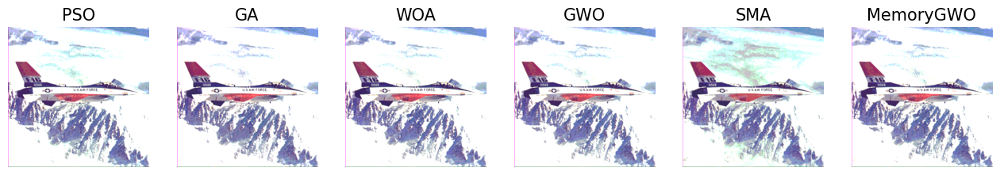

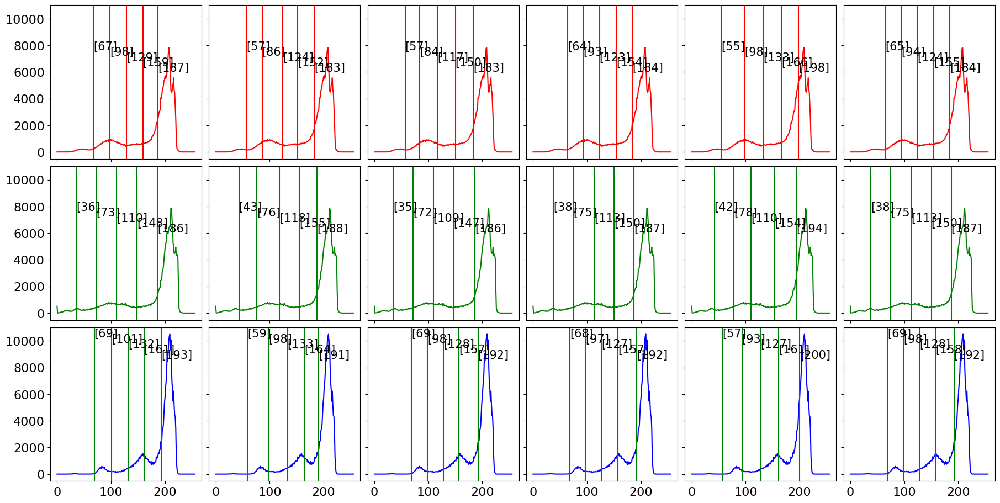

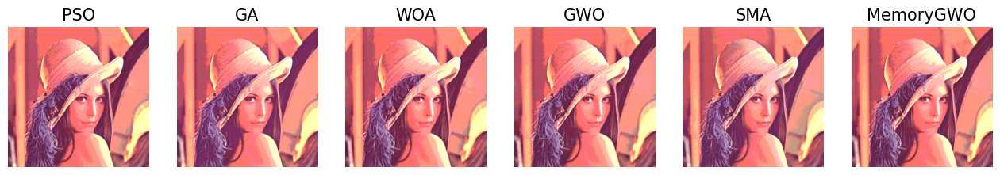

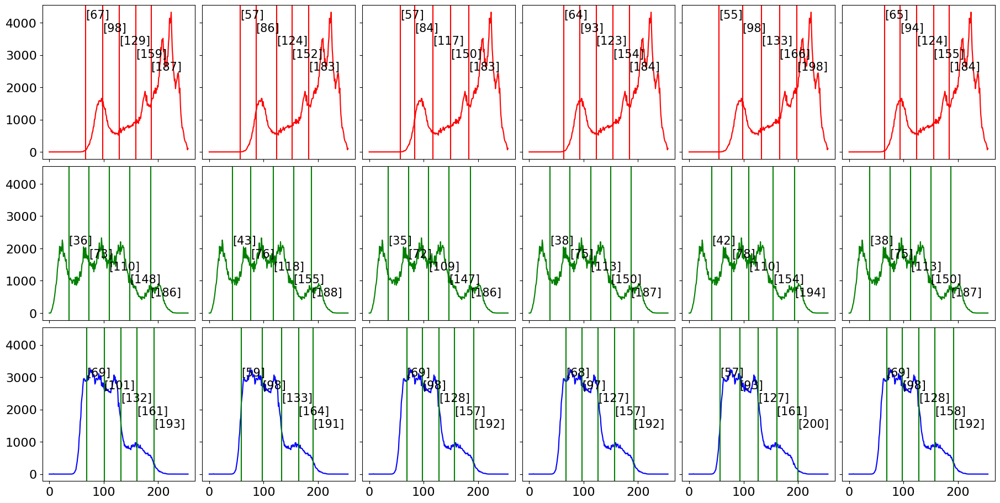

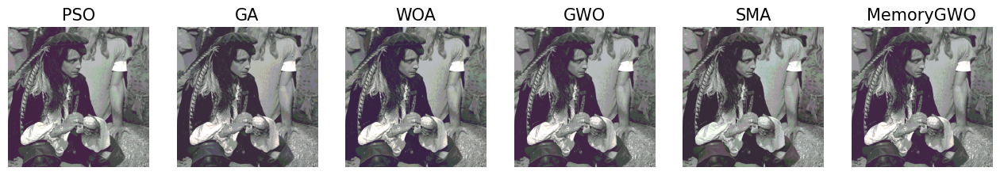

...

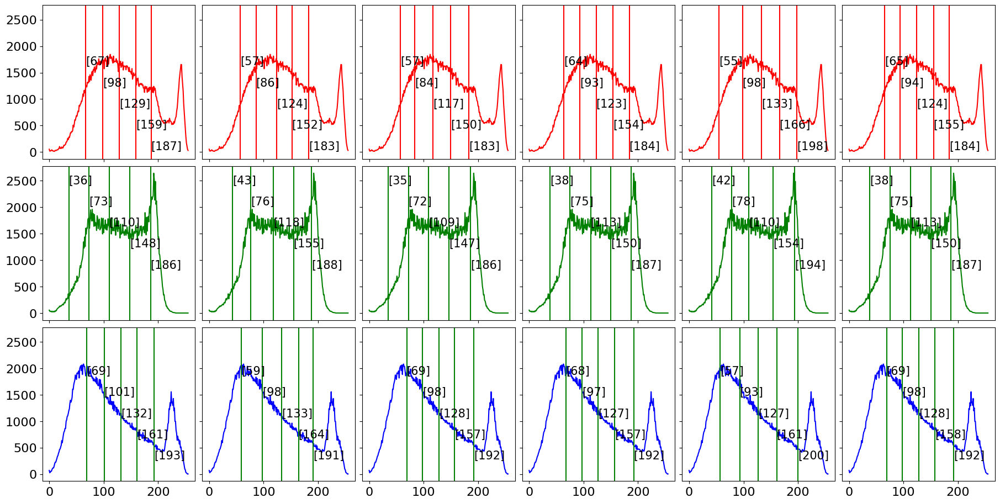

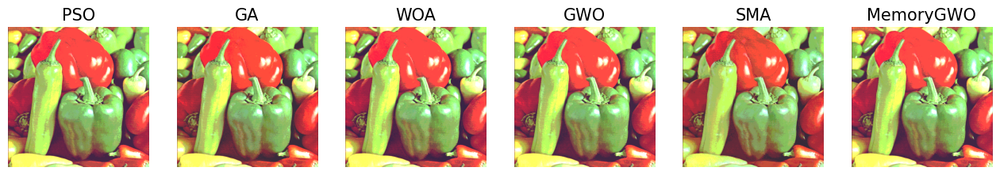

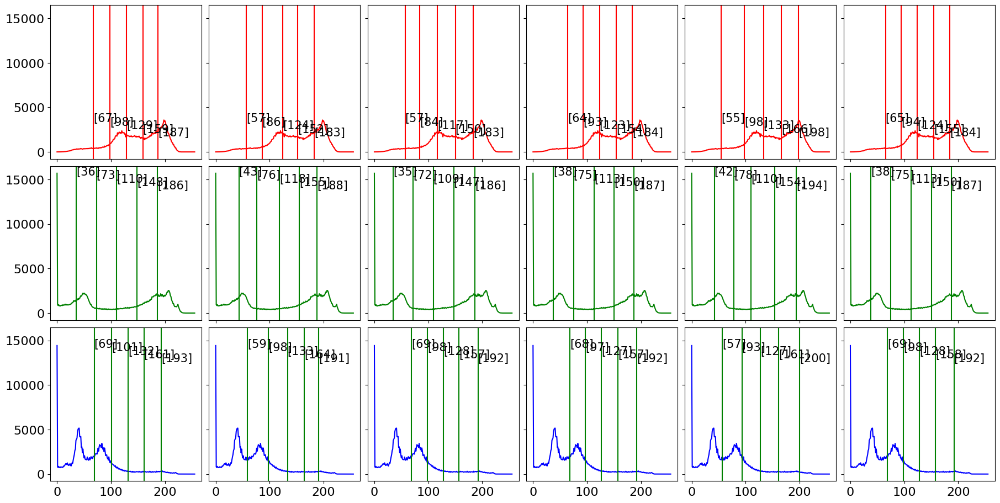

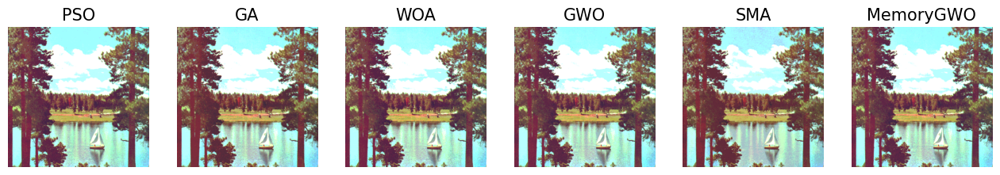

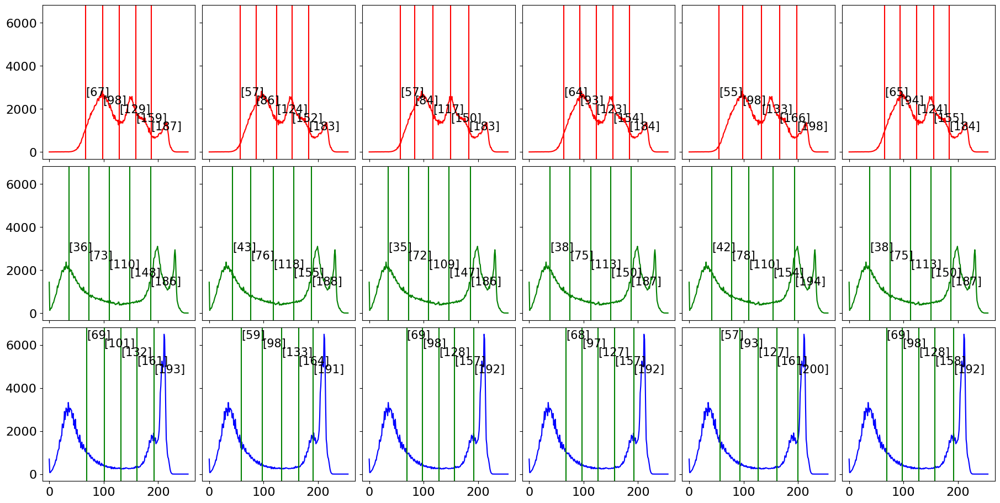

In [32]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400